### 1.1- Loading Image Paths

In [ ]:
import os
import glob
import time
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb

import torch
from torch import nn, optim
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
use_colab = None


cuda


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### 1.1.x Preparing Colab for running the code

In [ ]:
# !pip3 install fastai --upgrade

The following will download about 20,000 images from COCO dataset. Notice that **we are going to use only 8000 of them** for training. Also you can use any other dataset like ImageNet as long as it contains various scenes and locations.

In [ ]:
from fastai.data.external import untar_data, URLs
coco_path = untar_data(URLs.COCO_SAMPLE)
coco_path = str(coco_path) + "/train_sample"
use_colab = True

1. save 5 images to a variable ('/root/.fastai/data/coco_sample/train_sample/000000198137.jpg' , '/root/.fastai/data/coco_sample/train_sample/000000198137.jpg'
2. remain all the code except train_model function
3. In the train_model func, modify _ _ (load the variable e.g. images_folder) so we can feed graylish images to our moedel and output the colorized images.

In [ ]:
if use_colab == True:
    path = coco_path
else:
    path = "/home/omen/.fastai/data/coco_sample/train_sample"

paths = glob.glob(path + "/*.jpg") # Grabbing all the image file names
train_paths = paths[:8000]
val_paths = paths[8000:10000]
# print(paths)
print(len(train_paths), len(val_paths))

8000 2000


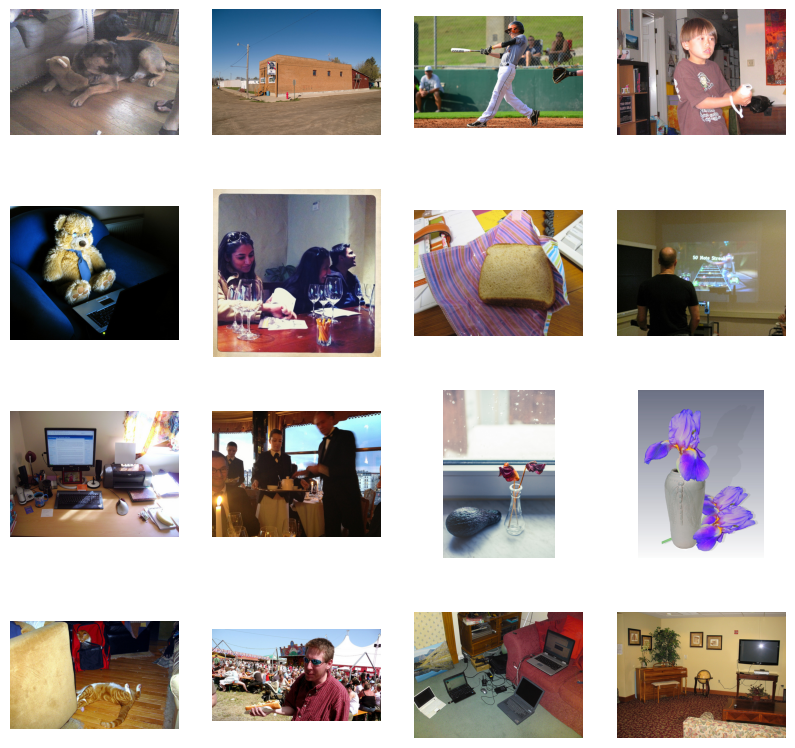

In [ ]:
_, axes = plt.subplots(4, 4, figsize=(10, 10))
for ax, img_path in zip(axes.flatten(), train_paths):
    ax.imshow(Image.open(img_path))
    ax.axis("off")

Although we are using the same dataset and number of training samples, the exact 8000 images that you train your model on may vary (although we are seeding!) because the dataset here has only 20000 images with different ordering while I sampled 10000 images from the complete dataset.

### 1.2- Making Datasets and DataLoaders

In [ ]:
SIZE = 256
class ColorizationDataset(Dataset):
    def __init__(self, paths, split='train'):
        if split == 'train':
            self.transforms = transforms.Compose([
                transforms.Resize((SIZE, SIZE),  Image.BICUBIC),
                transforms.RandomHorizontalFlip(), # A little data augmentation!
            ])
        elif split == 'val':
            self.transforms = transforms.Resize((SIZE, SIZE),  Image.BICUBIC)

        self.split = split
        self.size = SIZE
        self.paths = paths

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        img = self.transforms(img)
        img = np.array(img)
        img_lab = rgb2lab(img).astype("float32") # Converting RGB to L*a*b
        img_lab = transforms.ToTensor()(img_lab)
        L = img_lab[[0], ...] / 50. - 1. # Between -1 and 1
        ab = img_lab[[1, 2], ...] / 110. # Between -1 and 1

        return {'L': L, 'ab': ab}

    def __len__(self):
        return len(self.paths)

def make_dataloaders(batch_size=16, n_workers=4, pin_memory=True, **kwargs): # A handy function to make our dataloaders
    dataset = ColorizationDataset(**kwargs)
    dataloader = DataLoader(dataset, batch_size=batch_size, num_workers=n_workers,
                            pin_memory=pin_memory)
    return dataloader

In [ ]:
train_dl = make_dataloaders(paths=train_paths, split='train')
val_dl = make_dataloaders(paths=val_paths, split='val')
print(train_dl)
data = next(iter(train_dl))
Ls, abs_ = data['L'], data['ab']
print(Ls.shape, abs_.shape)
print(len(train_dl), len(val_dl))

torch.Size([16, 1, 256, 256]) torch.Size([16, 2, 256, 256])
500 125


### 1.3- Generator proposed by the paper

In [ ]:
class UnetBlock(nn.Module):
    def __init__(self, nf, ni, submodule=None, input_c=None, dropout=False,
                 innermost=False, outermost=False):
        super().__init__()
        self.outermost = outermost
        if input_c is None: input_c = nf
        downconv = nn.Conv2d(input_c, ni, kernel_size=4,
                             stride=2, padding=1, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = nn.BatchNorm2d(ni)
        uprelu = nn.ReLU(True)
        upnorm = nn.BatchNorm2d(nf)

        if outermost:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(ni, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            if dropout: up += [nn.Dropout(0.5)]
            model = down + [submodule] + up
        self.model = nn.Sequential(*model)

    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

class Unet(nn.Module):
    def __init__(self, input_c=1, output_c=2, n_down=8, num_filters=64):
        super().__init__()
        unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)
        for _ in range(n_down - 5):
            unet_block = UnetBlock(num_filters * 8, num_filters * 8, submodule=unet_block, dropout=True)
        out_filters = num_filters * 8
        for _ in range(3):
            unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
            out_filters //= 2
        self.model = UnetBlock(output_c, out_filters, input_c=input_c, submodule=unet_block, outermost=True)

    def forward(self, x):
        return self.model(x)

### 1.4- Discriminator

In [ ]:
class PatchDiscriminator(nn.Module):
    def __init__(self, input_c, num_filters=64, n_down=3):
        super().__init__()
        model = [self.get_layers(input_c, num_filters, norm=False)]
        model += [self.get_layers(num_filters * 2 ** i, num_filters * 2 ** (i + 1), s=1 if i == (n_down-1) else 2)
                          for i in range(n_down)] # the 'if' statement is taking care of not using
                                                  # stride of 2 for the last block in this loop
        model += [self.get_layers(num_filters * 2 ** n_down, 1, s=1, norm=False, act=False)] # Make sure to not use normalization or
                                                                                             # activation for the last layer of the model
        self.model = nn.Sequential(*model)

    def get_layers(self, ni, nf, k=4, s=2, p=1, norm=True, act=True): # when needing to make some repeatitive blocks of layers,
        layers = [nn.Conv2d(ni, nf, k, s, p, bias=not norm)]          # it's always helpful to make a separate method for that purpose
        if norm: layers += [nn.BatchNorm2d(nf)]
        if act: layers += [nn.LeakyReLU(0.2, True)]
        return nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

Let's take a look at its blocks:

In [ ]:
PatchDiscriminator(3)

PatchDiscriminator(
  (model): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (

And its output shape:

In [ ]:
discriminator = PatchDiscriminator(3)
dummy_input = torch.randn(16, 3, 256, 256) # batch_size, channels, size, size
out = discriminator(dummy_input)
out.shape

torch.Size([16, 1, 30, 30])

### 1.5- GAN Loss

In [ ]:
class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()

    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)

    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

### 1.x Model Initialization

In [ ]:
def init_weights(net, init='norm', gain=0.02):

    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')

            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)

    net.apply(init_func)
    print(f"model initialized with {init} initialization")
    return net

def init_model(model, device):
    model = model.to(device)
    model = init_weights(model)
    return model

### 1.6- Putting everything together

In [ ]:
class MainModel(nn.Module):
    def __init__(self, net_G=None, lr_G=2e-4, lr_D=2e-4,
                 beta1=0.5, beta2=0.999, lambda_L1=100.):
        super().__init__()

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1

        if net_G is None:
            self.net_G = init_model(Unet(input_c=1, output_c=2, n_down=8, num_filters=64), self.device)
        else:
            self.net_G = net_G.to(self.device)
        self.net_D = init_model(PatchDiscriminator(input_c=3, n_down=3, num_filters=64), self.device)
        self.GANcriterion = GANLoss(gan_mode='vanilla').to(self.device)
        self.L1criterion = nn.L1Loss()
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))

    def set_requires_grad(self, model, requires_grad=True):
        for p in model.parameters():
            p.requires_grad = requires_grad

    def setup_input(self, data):
        self.L = data['L'].to(self.device)
        self.ab = data['ab'].to(self.device)

    def forward(self):
        self.fake_color = self.net_G(self.L)

    def backward_D(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image.detach())
        self.loss_D_fake = self.GANcriterion(fake_preds, False)
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.net_D(real_image)
        self.loss_D_real = self.GANcriterion(real_preds, True)
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()

    def backward_G(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image)
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_L1 = self.L1criterion(self.fake_color, self.ab) * self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()

    def optimize(self):
        self.forward()
        self.net_D.train()
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()
        self.backward_D()
        self.opt_D.step()

        self.net_G.train()
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()
        self.backward_G()
        self.opt_G.step()

### 1.xx Utility functions

In [ ]:
class AverageMeter:
    def __init__(self):
        self.reset()

    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3

    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

def create_loss_meters():
    loss_D_fake = AverageMeter()
    loss_D_real = AverageMeter()
    loss_D = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_L1 = AverageMeter()
    loss_G = AverageMeter()

    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

def lab_to_rgb(L, ab):
    """
    Takes a batch of images
    """

    L = (L + 1.) * 50.
    ab = ab * 110.
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)

def visualize(model, data, save=True):
    model.net_G.eval()
    with torch.no_grad():
        model.setup_input(data)
        model.forward()
    model.net_G.train()
    fake_color = model.fake_color.detach()
    real_color = model.ab
    L = model.L
    fake_imgs = lab_to_rgb(L, fake_color)
    real_imgs = lab_to_rgb(L, real_color)
    fig = plt.figure(figsize=(15, 8))
    for i in range(5):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()
    if save:
        fig.savefig(f"colorization_{time.time()}.png")

def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

### 1.7- Training function

In [ ]:
def train_model(model, train_dl, epochs, save_images_folder, display_every=200):

    for e in range(epochs):
        loss_meter_dict = create_loss_meters()  # function returning a dictionary of objects to log the losses of the complete network
        i = 0  # Counter for iterations

        for data_batch in tqdm(train_dl):
            model.setup_input(data_batch)
            model.optimize()
            update_losses(model, loss_meter_dict, count=data_batch['L'].size(0))  # function updating the log objects
            i += 1

            if i % display_every == 0:
                print(f"\nEpoch {e + 1}/{epochs}")
                print(f"Iteration {i}/{len(train_dl)}")
                log_results(loss_meter_dict)  # function to print out the losses
                visualize(model, data_batch, save=False)  # function displaying the model's outputs

              # At the end of the last epoch, save the images separately
        if e == epochs - 1:
              save_images_separately(model, data_batch, save_images_folder)

def save_images_separately(model, data, save_folder):
    model.net_G.eval()
    with torch.no_grad():
        model.setup_input(data)
        model.forward()
    model.net_G.train()
    fake_color = model.fake_color.detach()
    real_color = model.ab
    L = model.L
    fake_imgs = lab_to_rgb(L, fake_color)
    real_imgs = lab_to_rgb(L, real_color)

    # os.makedirs(save_folder, exist_ok=True)

    # Save Grayscale, Fake Colorized, and Real Color images separately
    # print(L.shape) # torch.Size([16, 1, 256, 256])
    save_images(L[:, 0].cpu().numpy(), "grayscale", save_folder)
    save_images(fake_imgs, "fake_colorized", save_folder)
    save_images(real_imgs, "real_colorized", save_folder)

def save_images(images, prefix, folder):
    os.makedirs(folder, exist_ok=True)  # Create the folder if it doesn't exist
    for i, image in enumerate(images):
        filename = os.path.join(folder, f"{prefix}_{i}_{time.time()}.png")
        plt.imsave(filename, image)

model = MainModel()
# train_model(model, train_dl, 100)
# train_model(model, train_dl, 20, "G_not_pretrained_vanilla")

model initialized with norm initialization
model initialized with norm initialization


Every epoch takes about 3 to 4 minutes on Colab. After about 20 epochs you should see some reasonable results.

## 2- A new strategy - the final model

### 2.1- Using a new generator

In [ ]:
# pip install fastai==2.4
from fastai.vision.learner import create_body
from torchvision.models.resnet import resnet18
from torchvision.models.resnet import resnet34
from fastai.vision.models.unet import DynamicUnet

In [ ]:
def build_res_unet(n_input=1, n_output=2, size=256):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = resnet18(pretrained=True)
    body = create_body(model, pretrained=True, n_in=n_input, cut=-2)
    net_G = DynamicUnet(body, n_output, (size, size)).to(device)
    return net_G

### 2.2 Pretraining the generator for colorization task

In [ ]:
def pretrain_generator(net_G, train_dl, opt, criterion, epochs):
    for e in range(epochs):
        loss_meter = AverageMeter()
        for data in tqdm(train_dl):
            L, ab = data['L'].to(device), data['ab'].to(device)
            preds = net_G(L)
            loss = criterion(preds, ab)
            opt.zero_grad()
            loss.backward()
            opt.step()

            loss_meter.update(loss.item(), L.size(0))

        print(f"Epoch {e + 1}/{epochs}")
        print(f"L1 Loss: {loss_meter.avg:.5f}")

net_G = build_res_unet(n_input=1, n_output=2, size=256)
opt = optim.Adam(net_G.parameters(), lr=1e-4)
criterion = nn.L1Loss()
# pretrain_generator(net_G, train_dl, opt, criterion, 20)
# torch.save(net_G.state_dict(), "res18-unet.pt")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


### 2.3 Putting everything together, again!

In [ ]:
net_G = build_res_unet(n_input=1, n_output=2, size=256)
net_G.load_state_dict(torch.load("/content/drive/MyDrive/res18-unet.pt", map_location=device))
model = MainModel(net_G=net_G)
# train_model(model, train_dl, 1, "res18_result")

# torch.save(model.state_dict(), "finetuned.pt")


model initialized with norm initialization


In [ ]:
!gdown --id 1lR6DcS4m5InSbZ5y59zkH2mHt_4RQ2KV

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1lR6DcS4m5InSbZ5y59zkH2mHt_4RQ2KV
To: /content/final_model_weights.pt
100% 136M/136M [00:00<00:00, 184MB/s]


In [ ]:
def visualize_model(model, train_dl, save_images_folder, display_every=200):
      i = 0
      for data in tqdm(train_dl):
          i += 1
          if i % display_every == 0:
              print(f"Iteration {i}/{len(train_dl)}")
              # visualize(model, data, save=False) # function displaying the model's outputs
      save_images_separately(model, data, save_images_folder)

In [ ]:
net_G = build_res_unet(n_input=1, n_output=2, size=256)
net_G.load_state_dict(torch.load("/content/drive/MyDrive/res18-unet.pt", map_location=device))
model = MainModel(net_G=net_G)
model.load_state_dict(torch.load("/content/drive/MyDrive/final_model_weights.pt", map_location=device))
visualize_model(model, train_dl, 'G_pretrained_res18_result')


model initialized with norm initialization


  0%|          | 0/500 [00:00<?, ?it/s]

Iteration 200/500
Iteration 400/500


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 2 pixels
  return func(*args, **kwargs)


In [ ]:
def build_res_unet_34(n_input=1, n_output=2, size=256):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = resnet34(pretrained=True)
    body = create_body(model, pretrained=True, n_in=n_input, cut=-2)
    net_G = DynamicUnet(body, n_output, (size, size)).to(device)
    return net_G


net_G = build_res_unet_34(n_input=1, n_output=2, size=256)
opt = optim.Adam(net_G.parameters(), lr=1e-4)
criterion = nn.L1Loss()
# pretrain_generator(net_G, train_dl, opt, criterion, 20)
# torch.save(net_G.state_dict(), "res34-unet.pt")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 1/20
L1 Loss: 0.08598


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 2/20
L1 Loss: 0.08316


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 3/20
L1 Loss: 0.08283


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 4/20
L1 Loss: 0.08257


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 5/20
L1 Loss: 0.08220


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 6/20
L1 Loss: 0.08187


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 7/20
L1 Loss: 0.08150


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 8/20
L1 Loss: 0.08116


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 9/20
L1 Loss: 0.08062


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 10/20
L1 Loss: 0.08020


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 11/20
L1 Loss: 0.07979


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 12/20
L1 Loss: 0.07926


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 13/20
L1 Loss: 0.07855


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 14/20
L1 Loss: 0.07813


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 15/20
L1 Loss: 0.07753


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 16/20
L1 Loss: 0.07669


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 17/20
L1 Loss: 0.07603


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 18/20
L1 Loss: 0.07548


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 19/20
L1 Loss: 0.07459


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 20/20
L1 Loss: 0.07411


model initialized with norm initialization


  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 1/20
Iteration 200/500
loss_D_fake: 0.52583
loss_D_real: 0.56463
loss_D: 0.54523
loss_G_GAN: 1.28054
loss_G_L1: 8.45329
loss_G: 9.73383


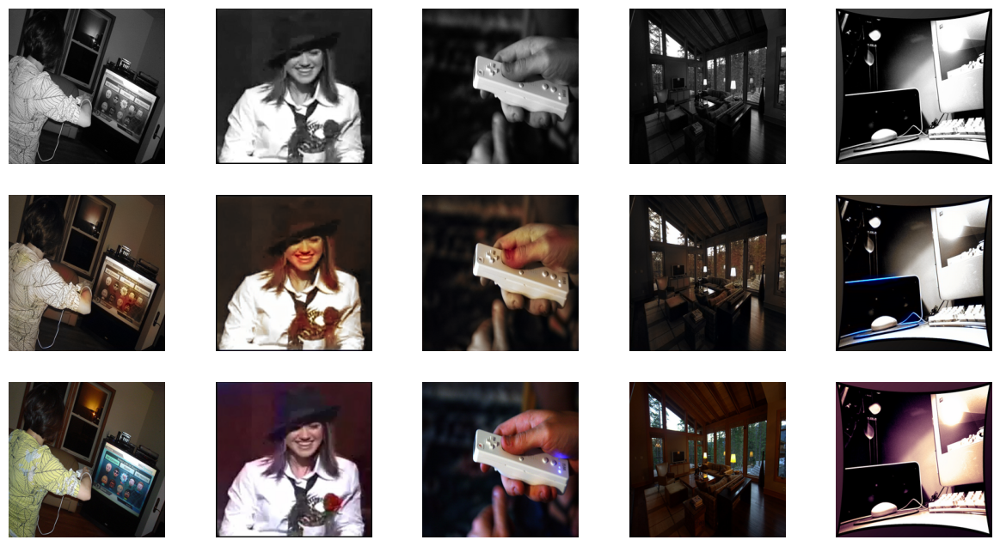


Epoch 1/20
Iteration 400/500
loss_D_fake: 0.53021
loss_D_real: 0.55283
loss_D: 0.54152
loss_G_GAN: 1.30271
loss_G_L1: 8.69711
loss_G: 9.99983


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return func(*args, **kwargs)


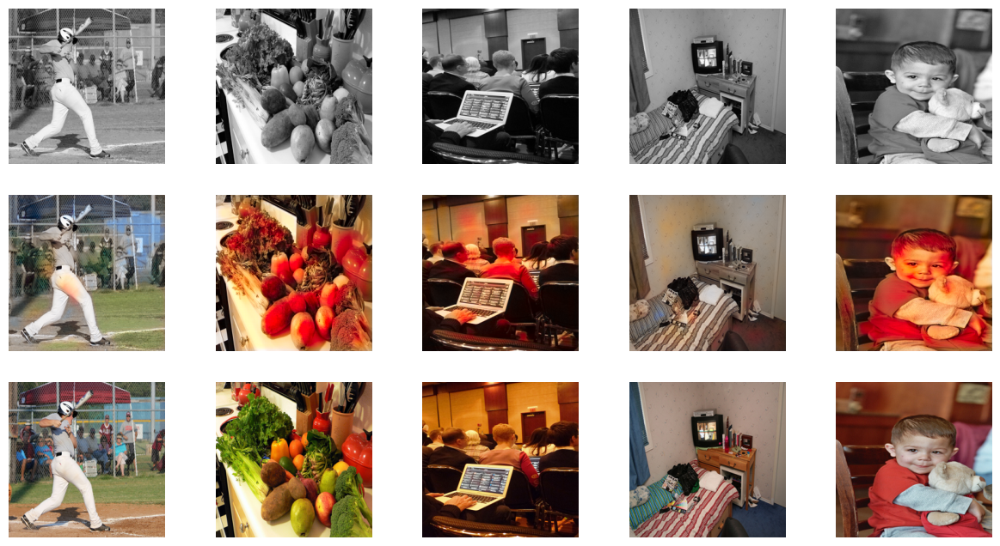

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 2/20
Iteration 200/500
loss_D_fake: 0.56048
loss_D_real: 0.56947
loss_D: 0.56498
loss_G_GAN: 1.24630
loss_G_L1: 9.12029
loss_G: 10.36659


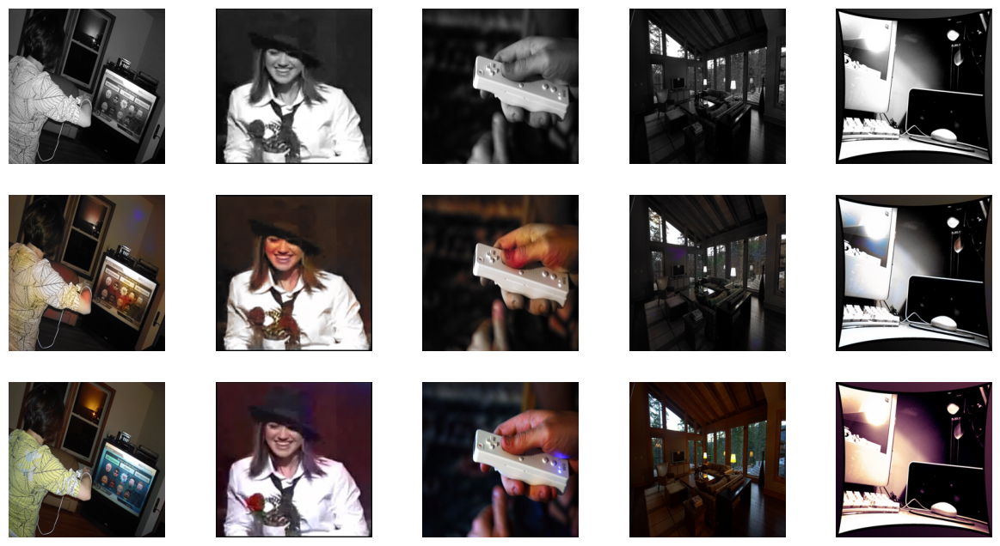


Epoch 2/20
Iteration 400/500
loss_D_fake: 0.56232
loss_D_real: 0.57181
loss_D: 0.56707
loss_G_GAN: 1.22827
loss_G_L1: 9.16119
loss_G: 10.38946


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 13735 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 3 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 2195 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 203 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 5 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 1103 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimag

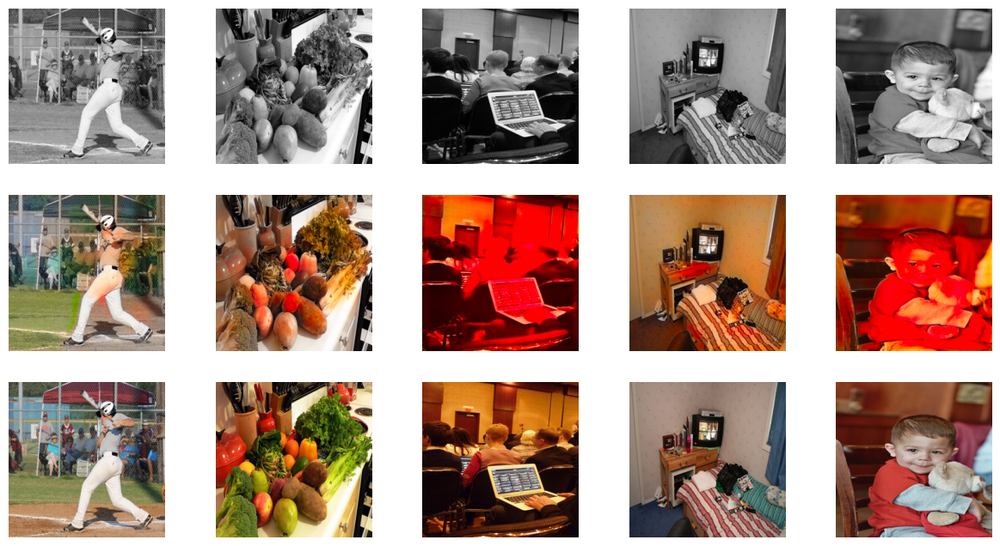

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 3/20
Iteration 200/500
loss_D_fake: 0.56938
loss_D_real: 0.59512
loss_D: 0.58225
loss_G_GAN: 1.15396
loss_G_L1: 9.14231
loss_G: 10.29627


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 122 pixels
  return func(*args, **kwargs)


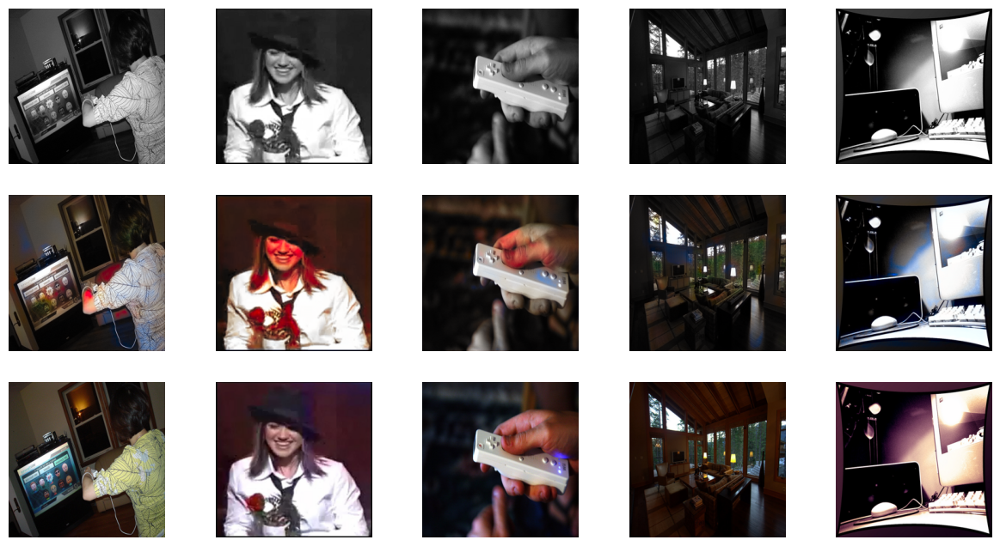


Epoch 3/20
Iteration 400/500
loss_D_fake: 0.57084
loss_D_real: 0.59828
loss_D: 0.58456
loss_G_GAN: 1.14216
loss_G_L1: 9.12490
loss_G: 10.26705


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 96 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 57 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 844 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 40 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 21 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 172 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_s

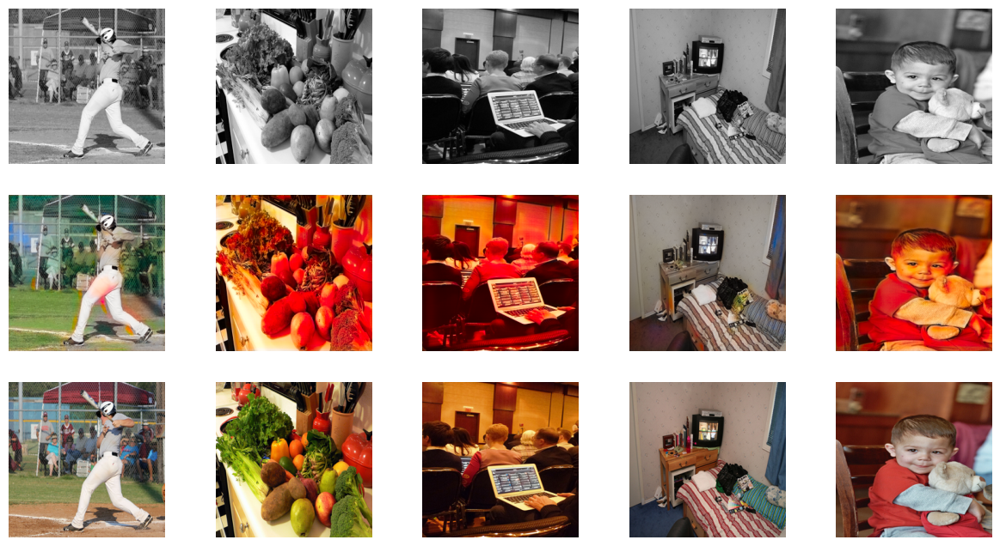

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 4/20
Iteration 200/500
loss_D_fake: 0.58374
loss_D_real: 0.61035
loss_D: 0.59704
loss_G_GAN: 1.09501
loss_G_L1: 9.01544
loss_G: 10.11045


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 15 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 53 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 25 pixels
  return func(*args, **kwargs)


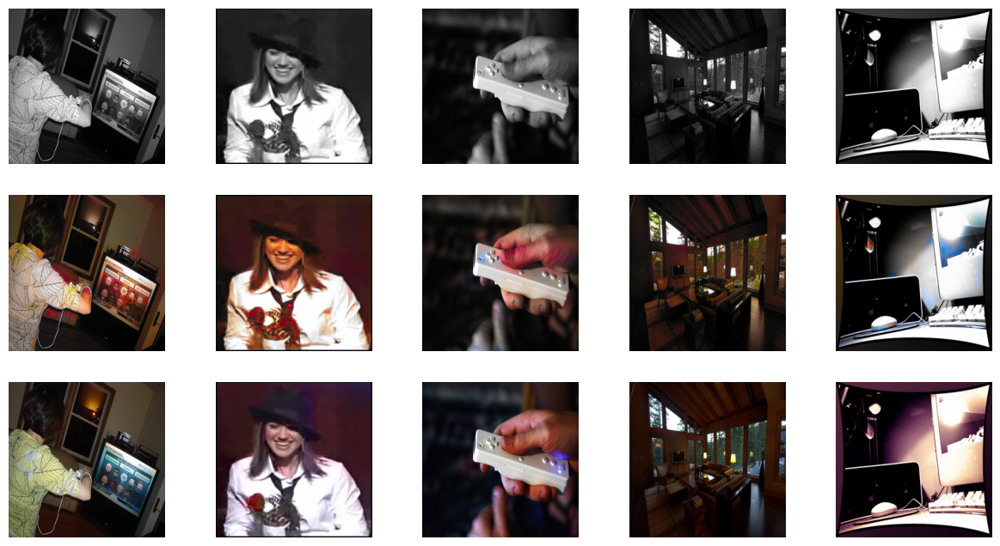


Epoch 4/20
Iteration 400/500
loss_D_fake: 0.58174
loss_D_real: 0.60714
loss_D: 0.59444
loss_G_GAN: 1.09176
loss_G_L1: 8.99382
loss_G: 10.08558


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 47 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 30 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 94 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 6 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 11 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 59 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shar

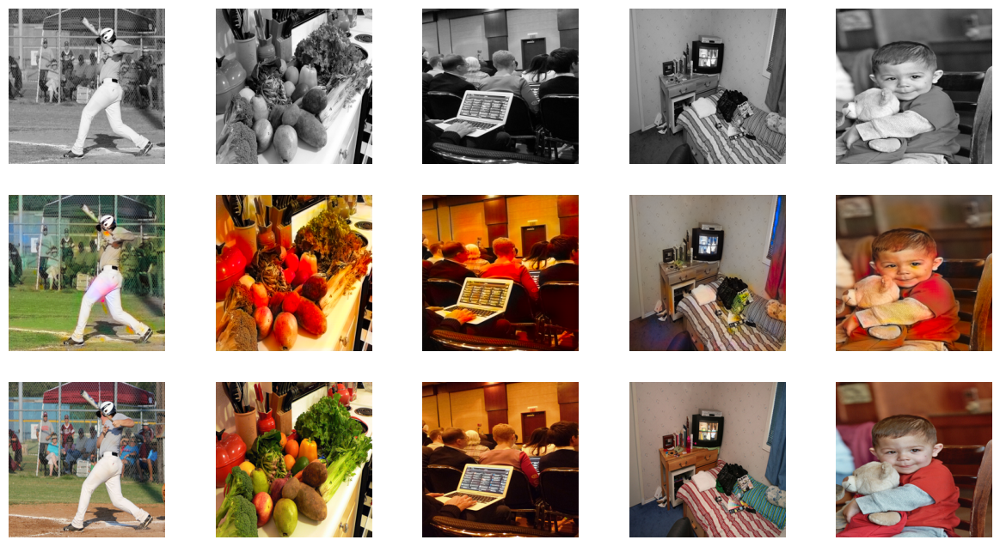

  0%|          | 0/500 [00:00<?, ?it/s]

Exception in thread Thread-38 (_pin_memory_loop):
Traceback (most recent call last):
  File "/usr/lib/python3.10/threading.py", line 1016, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.10/threading.py", line 953, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/_utils/pin_memory.py", line 51, in _pin_memory_loop
    do_one_step()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/_utils/pin_memory.py", line 28, in do_one_step
    r = in_queue.get(timeout=MP_STATUS_CHECK_INTERVAL)
  File "/usr/lib/python3.10/multiprocessing/queues.py", line 122, in get
    return _ForkingPickler.loads(res)
  File "/usr/local/lib/python3.10/dist-packages/torch/multiprocessing/reductions.py", line 307, in rebuild_storage_fd
    fd = df.detach()
  File "/usr/lib/python3.10/multiprocessing/resource_sharer.py", line 57, in detach
    with _resource_sharer.get_connection(self._id) as conn:
  File "/usr/lib/python3

KeyboardInterrupt: ignored

In [ ]:
net_G = build_res_unet_34(n_input=1, n_output=2, size=256)
net_G.load_state_dict(torch.load("/content/drive/MyDrive/res34-unet.pt", map_location=device))
model = MainModel(net_G=net_G)
train_model(model, train_dl, 20, "G_pretrained_res34_result")

In [ ]:
!zip -r G_not_pretrained_vanilla.zip /content/G_not_pretrained_vanilla/*

In [ ]:
!zip -r G_pretrained_res18_result.zip /content/G_pretrained_res18_result/*

  adding: content/G_pretrained_res18_result/fake_colorized_0_1696597540.2761629.png (deflated 0%)
  adding: content/G_pretrained_res18_result/fake_colorized_0_1696600964.2318738.png (deflated 0%)
  adding: content/G_pretrained_res18_result/fake_colorized_10_1696597540.6747372.png (deflated 0%)
  adding: content/G_pretrained_res18_result/fake_colorized_10_1696600964.623768.png (deflated 0%)
  adding: content/G_pretrained_res18_result/fake_colorized_11_1696597540.720111.png (deflated 0%)
  adding: content/G_pretrained_res18_result/fake_colorized_11_1696600964.6651013.png (deflated 0%)
  adding: content/G_pretrained_res18_result/fake_colorized_1_1696597540.3111813.png (deflated 0%)
  adding: content/G_pretrained_res18_result/fake_colorized_1_1696600964.265911.png (deflated 0%)
  adding: content/G_pretrained_res18_result/fake_colorized_12_1696597540.7536023.png (deflated 0%)
  adding: content/G_pretrained_res18_result/fake_colorized_12_1696600964.6941628.png (deflated 0%)
  adding: content

In [ ]:
!zip -r G_pretrained_res34_result.zip /content/G_pretrained_res34_result/*

!zip G_not_pretrained_vanilla.zip /content/G_not_pretrained_vanilla
!zip G_pretrained_res18_result.zip /content/G_pretrained_res18_result
!zip G_pretrained_res34_result.zip /content/G_pretrained_res34_result





## Diffusion Model

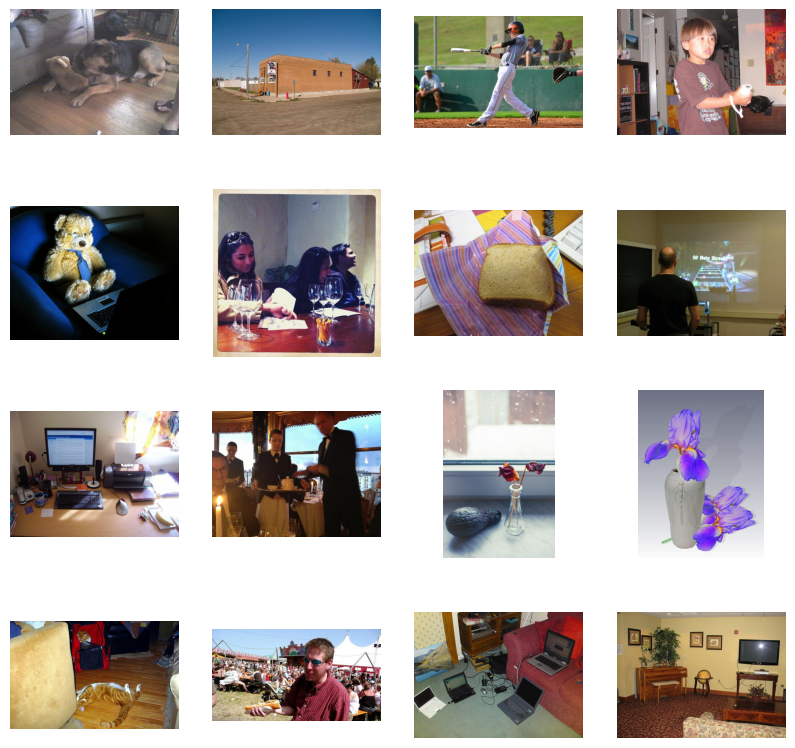

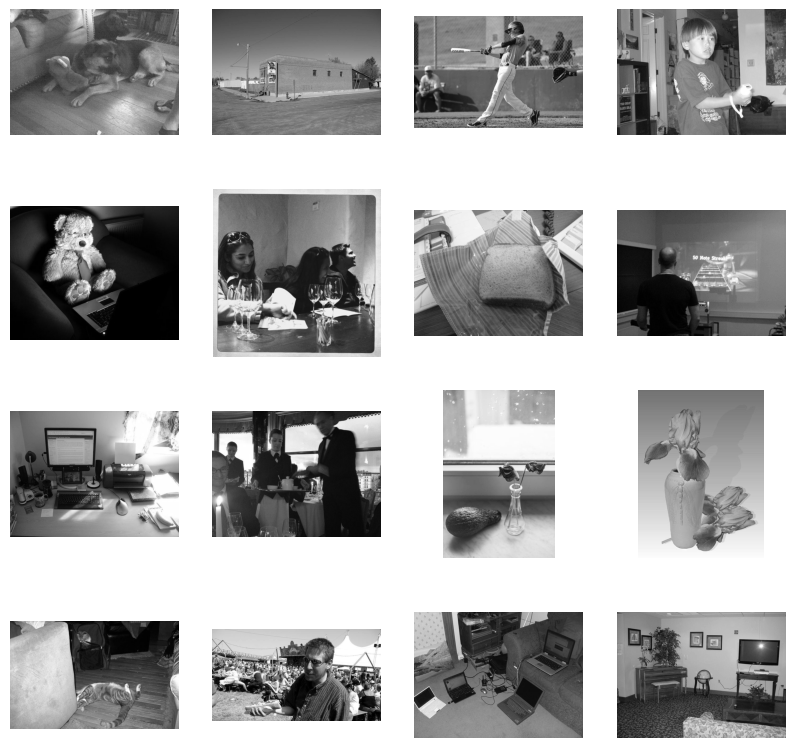

In [ ]:
path_color = '/root/.fastai/data/coco_sample/color/'
path_gray = '/root/.fastai/data/coco_sample/gray/'
path_flist = '/root/.fastai/data/coco_sample/flist/'
#seperate color/gray
if not os.path.exists(path_gray):
    os.mkdir(path_gray)
if not os.path.exists(path_color):
    os.mkdir(path_color)
dirs = os.listdir(coco_path)
for dir_item in dirs:
    image_file = Image.open(coco_path + '/' + dir_item)
    image_file.save(path_color + dir_item)
for dir_item in dirs:
		image_file = Image.open(path_color + dir_item) # open colour image
		image_file = image_file.convert('L') # convert image to black and white
		image_file.save(path_gray + dir_item)

#contruct flist
if not os.path.exists(path_flist):
    os.mkdir(path_flist)
fo = open(path_flist + 'train.flist', "w")
for item in train_paths:
    fo.write(item.split('/')[-1][:-4] + '\n')
fo.close()
fo = open(path_flist + 'test.flist', "w")
for item in val_paths:
    fo.write(item.split('/')[-1][:-4] + '\n')
fo.close()

color_paths = glob.glob(path_color + "*.jpg")
gray_paths = glob.glob(path_gray + "/*.jpg")
_, axes = plt.subplots(4, 4, figsize=(10, 10))
for ax, img_path in zip(axes.flatten(), color_paths):
    ax.imshow(Image.open(img_path))
    ax.axis("off")

_, axes = plt.subplots(4, 4, figsize=(10, 10))
for ax, img_path in zip(axes.flatten(), gray_paths):
    ax.imshow(Image.open(img_path), cmap='gray', vmin=0, vmax=255)
    ax.axis("off")

In [ ]:
!git clone https://github.com/xchwan/colorization_diffusion.git

Cloning into 'colorization_diffusion'...
remote: Enumerating objects: 345, done.
remote: Counting objects: 100% (345/345), done.
remote: Compressing objects: 100% (154/154), done.
remote: Total 345 (delta 194), reused 338 (delta 187), pack-reused 0
Receiving objects: 100% (345/345), 6.87 MiB | 39.08 MiB/s, done.
Resolving deltas: 100% (194/194), done.


In [ ]:
%cd colorization_diffusion

/content/colorization_diffusion


In [ ]:
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 3.3 MB/s eta 0:00:00


In [ ]:
torch.cuda.empty_cache()

In [ ]:
!python run.py -p train -c config/colorization_mirflickr25k.json

export CUDA_VISIBLE_DEVICES=0
/content/colorization_diffusion/run.py:28: UserWarning: You have chosen to use cudnn for accleration. torch.backends.cudnn.enabled=True
  warnings.warn('You have chosen to use cudnn for accleration. torch.backends.cudnn.enabled=True')
100% 1999/1999 [09:45<00:00,  3.41it/s]
100% 1999/1999 [09:36<00:00,  3.47it/s]
100% 1999/1999 [09:36<00:00,  3.47it/s]
100% 1999/1999 [09:36<00:00,  3.47it/s]
100% 1999/1999 [09:36<00:00,  3.47it/s]
  0% 0/2 [00:00<?, ?it/s]
sampling loop time step:   0% 0/2000 [00:00<?, ?it/s]
sampling loop time step:   0% 1/2000 [00:04<2:22:33,  4.28s/it]
sampling loop time step:   0% 5/2000 [00:04<22:00,  1.51it/s]  
sampling loop time step:   0% 9/2000 [00:04<10:25,  3.18it/s]
sampling loop time step:   1% 13/2000 [00:04<06:13,  5.32it/s]
sampling loop time step:   1% 17/2000 [00:04<04:10,  7.93it/s]
sampling loop time step:   1% 21/2000 [00:04<03:00, 10.98it/s]
sampling loop time step:   1% 25/2000 [00:04<02:17, 14.35it/s]
sampling loop

In [ ]:
!zip -r train_0920_val.zip /content/colorization_diffusion/experiments/train_colorization_mirflickr25k_230919_154331/results

In [ ]:
!python run.py -p test -c config/colorization_mirflickr25k.json